# Baseline CNN UNet model
Course: Applied Deep Learning, TU Wien <br>
Date: 16/12 2025<br>
Author: Helena Cooper<br>
Matrikel: 12505729<br>

This models uses the following: <br>
- Batch size: 8
- Optimiser: Adam
- Learning rate: 1e-4
- Loss: L1
- Epochs: 50

## Imports

In [11]:
import time
import glob
import torch
import numpy as np
from PIL import Image
import torch.nn as nn
from tqdm import tqdm
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from skimage.metrics import structural_similarity as ssim_metric
from skimage.metrics import peak_signal_noise_ratio as psnr_metric

## Helper classes and functions

### Description of @L1Loss
This class is used to calculate the L1 loss between the input and the target. <br>

Parameters: <br>
- **x** The input. <br>
- **y** The target. <br>

In [ ]:
class L1Loss(nn.Module):
    def __init__(self):
        super(L1Loss, self).__init__()

    def forward(self, x, y):
        diff = x - y
        loss = torch.abs(diff)
        return torch.mean(loss)

### Description of @CharbonnierLoss
This class is used to calculate the charbonnier loss between the input and the target. <br>

Parameters: <br>
- **eps** The epsilon factor set to 1e-6. <br>
- **x** The input. <br>
- **y** The target. <br>

In [ ]:
class CharbonnierLoss(nn.Module):
    """L1 Loss variant that is differentiable and MPS-safe."""
    def __init__(self, eps=1e-6):
        super(CharbonnierLoss, self).__init__()
        self.eps = eps

    def forward(self, x, y):
        diff = x - y
        loss = torch.sqrt(diff * diff + self.eps)
        return torch.mean(loss)

### Description of @TransformAndCacheDataset
This class is used to transform and cache a dataset for faster training. <br>

Parameters: <br>
- **file_list** List of paths for dataset. <br>
- **upscale_factor** The factor to downgrade the input image with. By default it is set to 4. <br>

In [ ]:
class TransformAndCacheDataset(Dataset):
    def __init__(self, file_list, upscale_factor=4):
        self.upscale_factor = upscale_factor
        
        # For target data (high resolution) resize to 256x256 and convert to tensor (TODO: why to tensor?)
        self.high_res_transform = transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor()
        ])
        
        # For input data (low resultion) upscale to decrease resolution, resize to 256x256, and convert to tensor
        self.low_res_transform = transforms.Compose([
            transforms.Resize((256 // upscale_factor, 256 // upscale_factor)),
            transforms.Resize((256, 256)),
            transforms.ToTensor()
        ])

        # Pre-load all images into memory now
        #TODO: remove this print
        print(f"Caching {len(file_list)} images to memory...")
        
        self.data = []
        for img_path in tqdm(file_list): #TODO: remove tqdm, as it just makes a loading bar
            try:
                # Open and convert once
                image = Image.open(img_path).convert("RGB")
                
                # Apply transforms immediately and store TENSORS, not file paths
                high_res_tensor = self.high_res_transform(image)
                low_res_tensor = self.low_res_transform(image)
                
                self.data.append((low_res_tensor, high_res_tensor))
            except:
                pass # Skip broken images

    #TODO: do we need this length function?
    def __len__(self):
        return len(self.data)

    # Retrieves data from CachedDataset
    def __getitem__(self, idx):
        return self.data[idx]

In [ ]:
""" class SuperResolutionDataset(Dataset):
    def __init__(self, file_list, upscale_factor=4):
        self.file_list = file_list
        self.upscale_factor = upscale_factor
        
        self.hr_transform = transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor()
        ])
        self.lr_transform = transforms.Compose([
            transforms.Resize((256 // upscale_factor, 256 // upscale_factor)),
            transforms.Resize((256, 256)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        img_path = self.file_list[idx]
        image = Image.open(img_path).convert("RGB")
        hr = self.hr_transform(image)
        lr = self.lr_transform(image)
        return lr, hr """


In [14]:
def visualize_sample(model, loader, device, num_samples=3):
    model.eval() # Set model to evaluation mode
    
    # Get a single batch
    with torch.no_grad():
        low_res, high_res = next(iter(loader))
        low_res = low_res.to(device)
        
        # Get model prediction
        outputs = model(low_res)
        
    # Move images to CPU and numpy for plotting
    # We clip values to [0, 1] to avoid display errors with matplotlib
    low_res = low_res.cpu().permute(0, 2, 3, 1).numpy().clip(0, 1)
    outputs = outputs.cpu().permute(0, 2, 3, 1).numpy().clip(0, 1)
    high_res = high_res.cpu().permute(0, 2, 3, 1).numpy().clip(0, 1)

    plt.figure(figsize=(12, 4 * num_samples))
    
    for i in range(num_samples):
        # Plot Low Res (Input)
        plt.subplot(num_samples, 3, i*3 + 1)
        plt.imshow(low_res[i])
        plt.title("Input (Blurry)")
        plt.axis("off")

        # Plot Prediction (Output)
        plt.subplot(num_samples, 3, i*3 + 2)
        plt.imshow(outputs[i])
        plt.title("Model Prediction")
        plt.axis("off")

        # Plot High Res (Target)
        plt.subplot(num_samples, 3, i*3 + 3)
        plt.imshow(high_res[i])
        plt.title("Ground Truth (Sharp)")
        plt.axis("off")
        
    plt.tight_layout()
    plt.show() # If running in a script, you might want plt.savefig(f"epoch_results.png")
    
    model.train() # IMPORTANT: Switch back to training mode!

## Dataloader

In [ ]:
# Get all image paths from all subfolders
all_images = glob.glob("/Users/helenacooper/Desktop/9. semester/applied_deep_learning/images/**/*.jpg", recursive=True)
#TODO: remove the below, we only have .jpg files
#all_images += glob.glob("/Users/helenacooper/Desktop/9. semester/applied_deep_learning/images/**/*.png", recursive=True)
#all_images += glob.glob("/Users/helenacooper/Desktop/9. semester/applied_deep_learning/images/**/*.jpeg", recursive=True)

# Split into train/test (e.g., 80% train, 20% test)
train_files, test_files = train_test_split(all_images, test_size=0.2, random_state=42)

print("Process training data")
train_dataset = TransformAndCacheDataset(train_files)
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)

print("Process test data")
test_dataset = TransformAndCacheDataset(test_files)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

Processing Training Set...
⏳ Caching 548 images to RAM... this takes a moment but speeds up training huge!


100%|██████████| 548/548 [01:27<00:00,  6.30it/s]


Processing Test Set...
⏳ Caching 137 images to RAM... this takes a moment but speeds up training huge!


100%|██████████| 137/137 [00:27<00:00,  4.92it/s]


## Model functions and initialisation

In [ ]:
#TODO: do we need to make our own double conv?
class DoubleConv(nn.Module):
    """(Conv2d -> ReLU) x2"""
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

In [ ]:
#TODO: Be able to reason about the network here
class CnnUNet(nn.Module):
    def __init__(self):
        super(CnnUNet, self).__init__()

        # Encoder (Downsampling)
        self.enc1 = DoubleConv(3, 64)
        self.pool1 = nn.MaxPool2d(2)
        
        self.enc2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        
        self.enc3 = DoubleConv(128, 256)
        self.pool3 = nn.MaxPool2d(2)

        # Bottleneck
        self.bottleneck = DoubleConv(256, 512)

        # Decoder (Upsampling + SKIP CONNECTIONS)
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256) # Input is 512 because 256 (up3) + 256 (skip)
        
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128) # Input is 256 because 128 (up2) + 128 (skip)
        
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)  # Input is 128 because 64 (up1) + 64 (skip)

        self.final_conv = nn.Conv2d(64, 3, kernel_size=1)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        p1 = self.pool1(e1)
        
        e2 = self.enc2(p1)
        p2 = self.pool2(e2)
        
        e3 = self.enc3(p2)
        p3 = self.pool3(e3)

        # Bottleneck
        b = self.bottleneck(p3)

        # Decoder with Skips
        # We concatenate the encoder output (e3) with the upsampled bottleneck (x)
        x = self.up3(b)
        x = torch.cat([x, e3], dim=1) 
        x = self.dec3(x)

        x = self.up2(x)
        x = torch.cat([x, e2], dim=1)
        x = self.dec2(x)

        x = self.up1(x)
        x = torch.cat([x, e1], dim=1)
        x = self.dec1(x)

        return self.final_conv(x)

In [ ]:
#TODO: what is a device?
# Initialise the device - set to MPS if Mac, cuda if Windows, or else CPU.
device = torch.device(
    "cuda" if torch.cuda.is_available() 
    else "mps" if torch.backends.mps.is_available() 
    else "cpu"
)

print(f"Training on: {device}")

# Initialise the model
model = CnnUNet().to(device)

# Initialise the loss function
#criterion = nn.L1Loss() 
criterion = CharbonnierLoss().to(device)

# Initialise the optimiser
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

Training on: mps


## Model traning

100%|██████████| 69/69 [01:34<00:00,  1.37s/it]


Epoch [1/50], Loss: 0.1002


100%|██████████| 69/69 [01:31<00:00,  1.33s/it]


Epoch [2/50], Loss: 0.0318


100%|██████████| 69/69 [01:31<00:00,  1.33s/it]


Epoch [3/50], Loss: 0.0233


100%|██████████| 69/69 [01:31<00:00,  1.33s/it]


Epoch [4/50], Loss: 0.0218


100%|██████████| 69/69 [01:31<00:00,  1.33s/it]


Epoch [5/50], Loss: 0.0196
Creating visualization...


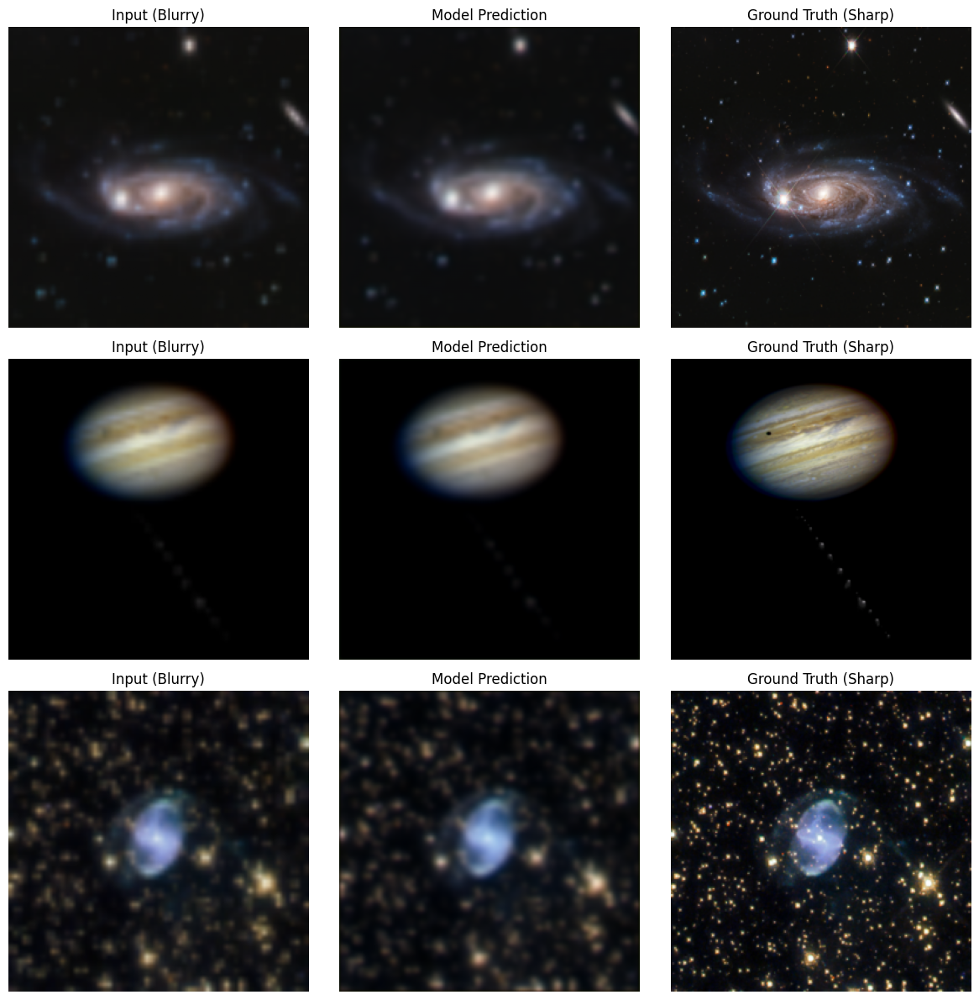

100%|██████████| 69/69 [01:32<00:00,  1.34s/it]


Epoch [6/50], Loss: 0.0182


100%|██████████| 69/69 [01:32<00:00,  1.33s/it]


Epoch [7/50], Loss: 0.0167


100%|██████████| 69/69 [01:32<00:00,  1.34s/it]


Epoch [8/50], Loss: 0.0160


100%|██████████| 69/69 [01:32<00:00,  1.34s/it]


Epoch [9/50], Loss: 0.0156


100%|██████████| 69/69 [01:32<00:00,  1.35s/it]


Epoch [10/50], Loss: 0.0152
Creating visualization...


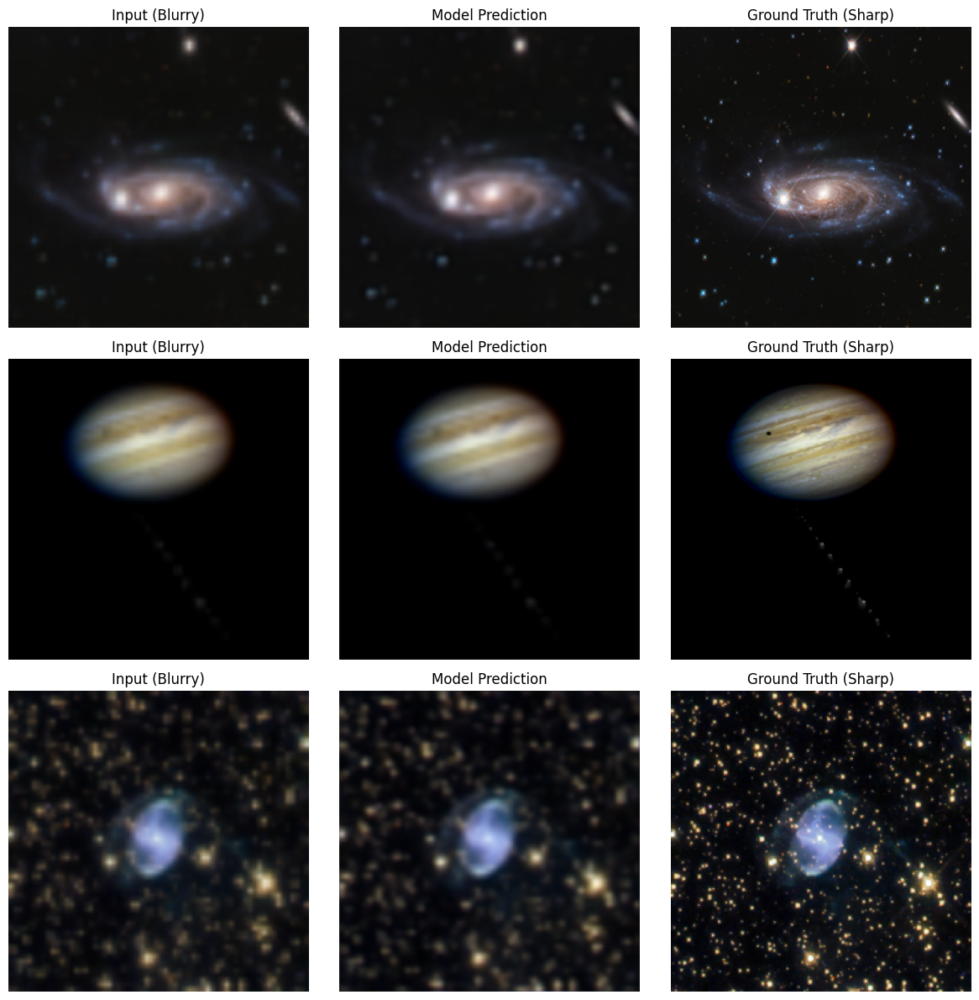

100%|██████████| 69/69 [01:33<00:00,  1.35s/it]


Epoch [11/50], Loss: 0.0149


100%|██████████| 69/69 [01:32<00:00,  1.34s/it]


Epoch [12/50], Loss: 0.0156


100%|██████████| 69/69 [01:32<00:00,  1.35s/it]


Epoch [13/50], Loss: 0.0142


100%|██████████| 69/69 [01:32<00:00,  1.34s/it]


Epoch [14/50], Loss: 0.0141


100%|██████████| 69/69 [01:32<00:00,  1.34s/it]


Epoch [15/50], Loss: 0.0142
Creating visualization...


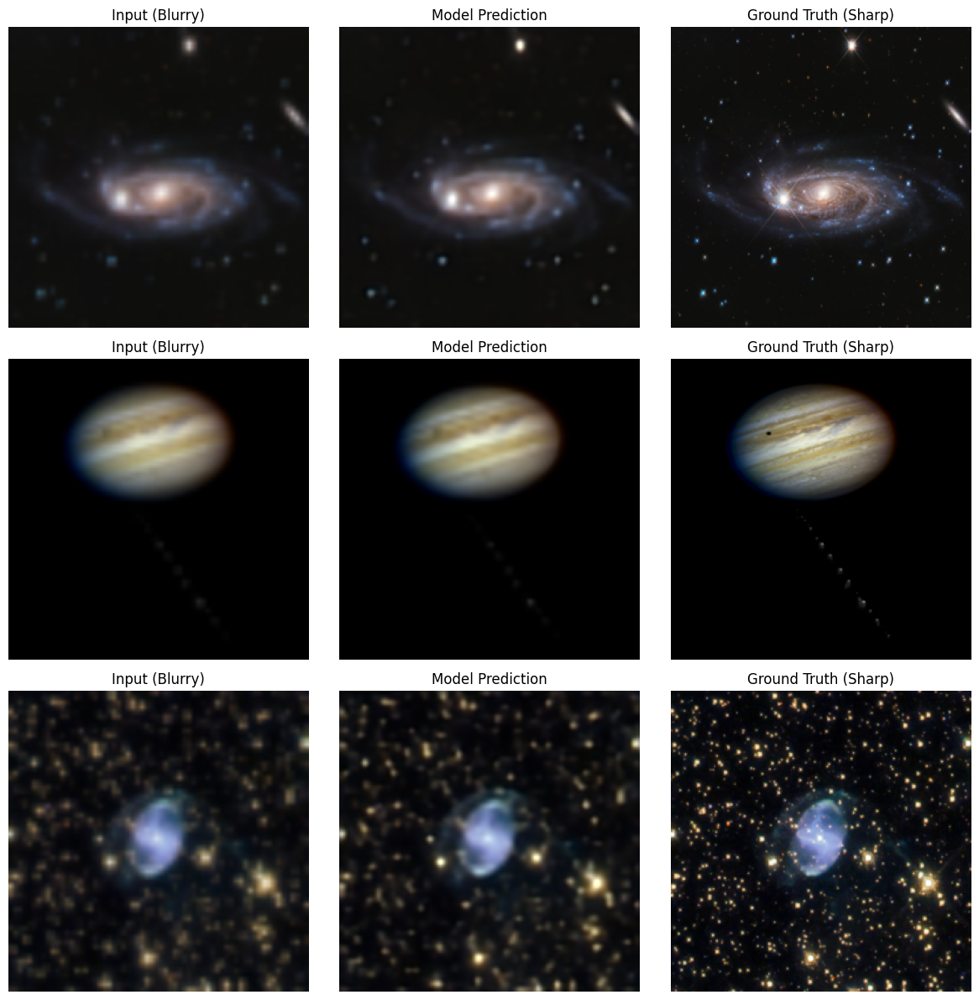

100%|██████████| 69/69 [01:33<00:00,  1.36s/it]


Epoch [16/50], Loss: 0.0135


100%|██████████| 69/69 [01:32<00:00,  1.34s/it]


Epoch [17/50], Loss: 0.0134


100%|██████████| 69/69 [01:33<00:00,  1.35s/it]


Epoch [18/50], Loss: 0.0135


100%|██████████| 69/69 [01:33<00:00,  1.35s/it]


Epoch [19/50], Loss: 0.0129


100%|██████████| 69/69 [01:32<00:00,  1.35s/it]


Epoch [20/50], Loss: 0.0128
Creating visualization...


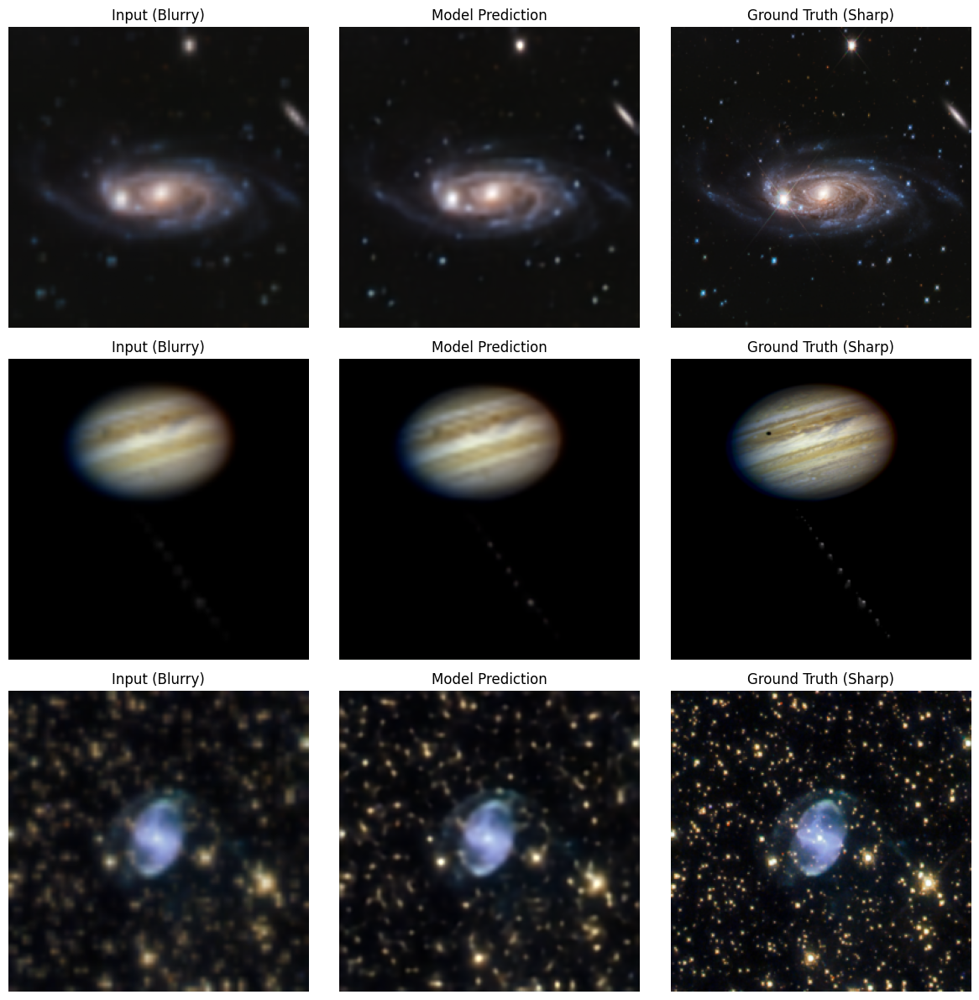

100%|██████████| 69/69 [01:33<00:00,  1.35s/it]


Epoch [21/50], Loss: 0.0128


100%|██████████| 69/69 [01:33<00:00,  1.36s/it]


Epoch [22/50], Loss: 0.0131


100%|██████████| 69/69 [01:34<00:00,  1.37s/it]


Epoch [23/50], Loss: 0.0124


100%|██████████| 69/69 [01:33<00:00,  1.36s/it]


Epoch [24/50], Loss: 0.0125


100%|██████████| 69/69 [01:33<00:00,  1.36s/it]


Epoch [25/50], Loss: 0.0126
Creating visualization...


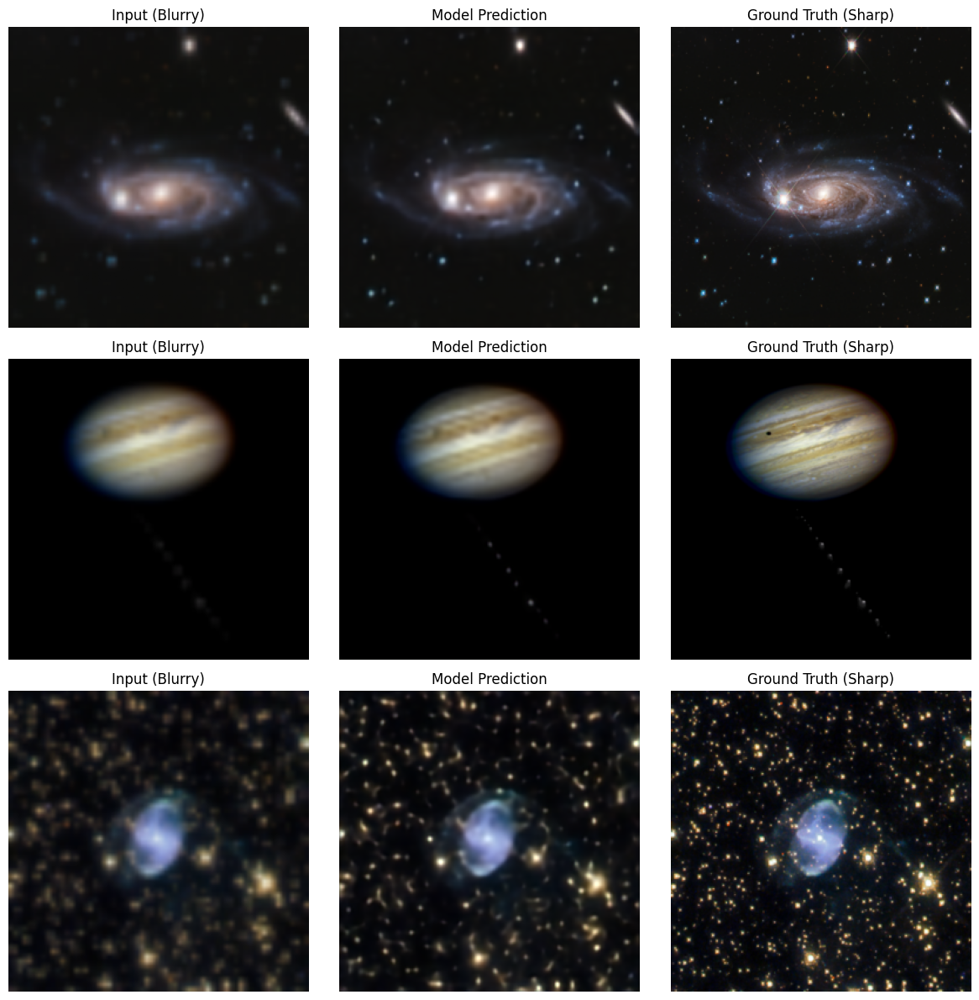

100%|██████████| 69/69 [01:34<00:00,  1.37s/it]


Epoch [26/50], Loss: 0.0122


100%|██████████| 69/69 [01:36<00:00,  1.39s/it]


Epoch [27/50], Loss: 0.0121


100%|██████████| 69/69 [01:52<00:00,  1.64s/it]


Epoch [28/50], Loss: 0.0122


100%|██████████| 69/69 [01:35<00:00,  1.38s/it]


Epoch [29/50], Loss: 0.0120


100%|██████████| 69/69 [01:33<00:00,  1.35s/it]


Epoch [30/50], Loss: 0.0127
Creating visualization...


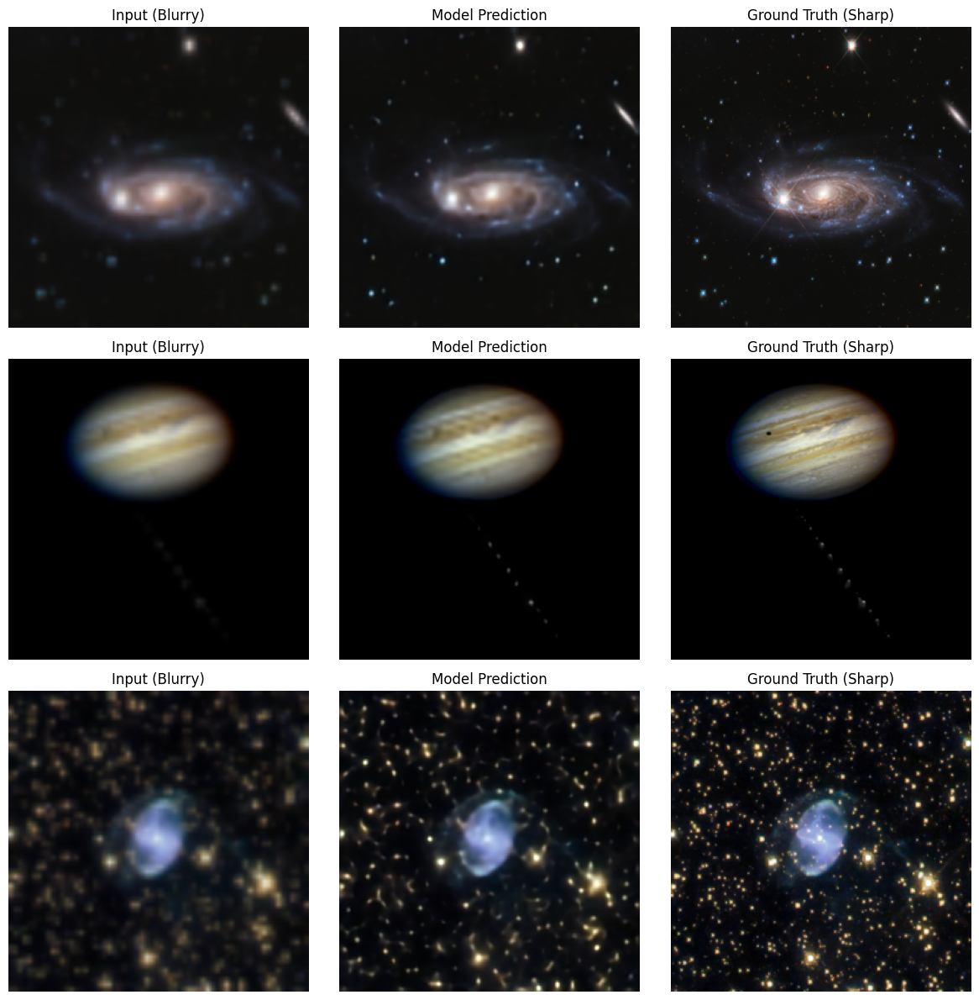

100%|██████████| 69/69 [01:32<00:00,  1.34s/it]


Epoch [31/50], Loss: 0.0121


100%|██████████| 69/69 [01:32<00:00,  1.34s/it]


Epoch [32/50], Loss: 0.0121


100%|██████████| 69/69 [01:31<00:00,  1.33s/it]


Epoch [33/50], Loss: 0.0118


100%|██████████| 69/69 [01:31<00:00,  1.33s/it]


Epoch [34/50], Loss: 0.0118


100%|██████████| 69/69 [01:32<00:00,  1.34s/it]


Epoch [35/50], Loss: 0.0122
Creating visualization...


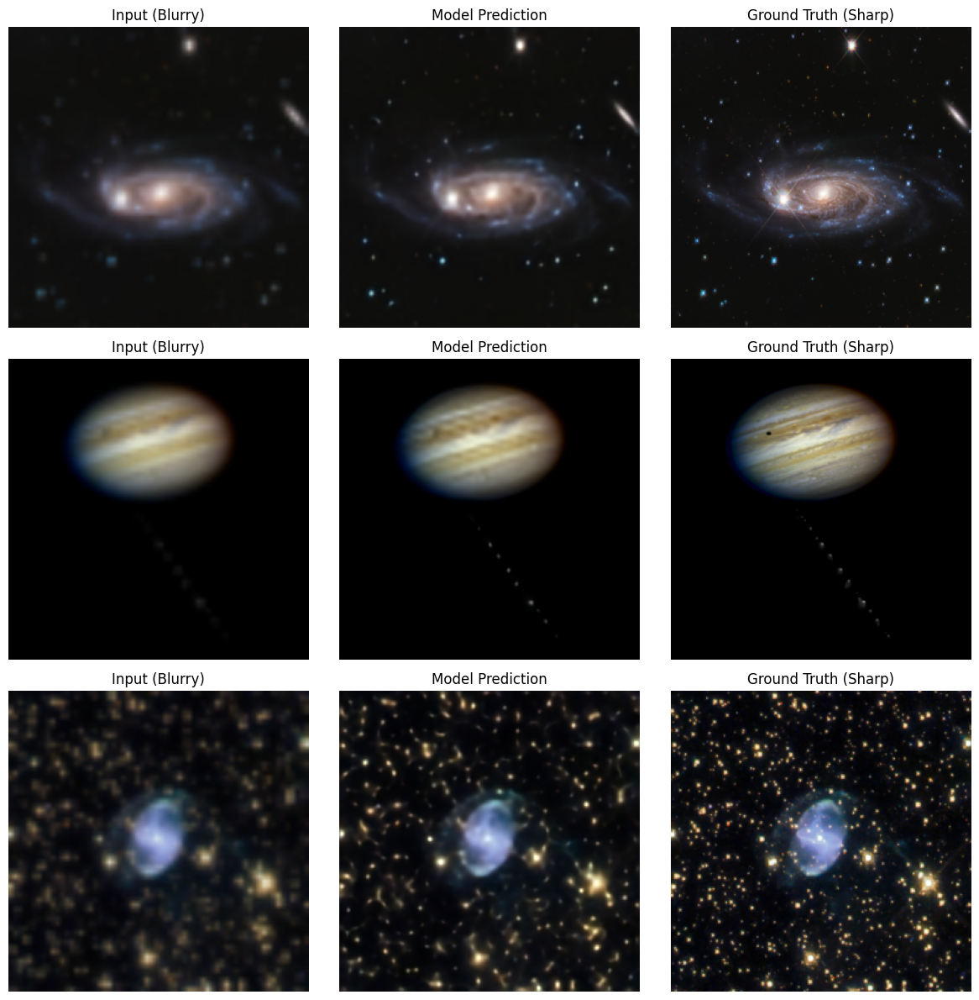

100%|██████████| 69/69 [01:32<00:00,  1.33s/it]


Epoch [36/50], Loss: 0.0120


100%|██████████| 69/69 [01:31<00:00,  1.33s/it]


Epoch [37/50], Loss: 0.0117


100%|██████████| 69/69 [01:31<00:00,  1.33s/it]


Epoch [38/50], Loss: 0.0115


100%|██████████| 69/69 [01:31<00:00,  1.33s/it]


Epoch [39/50], Loss: 0.0115


100%|██████████| 69/69 [01:31<00:00,  1.32s/it]


Epoch [40/50], Loss: 0.0119
Creating visualization...


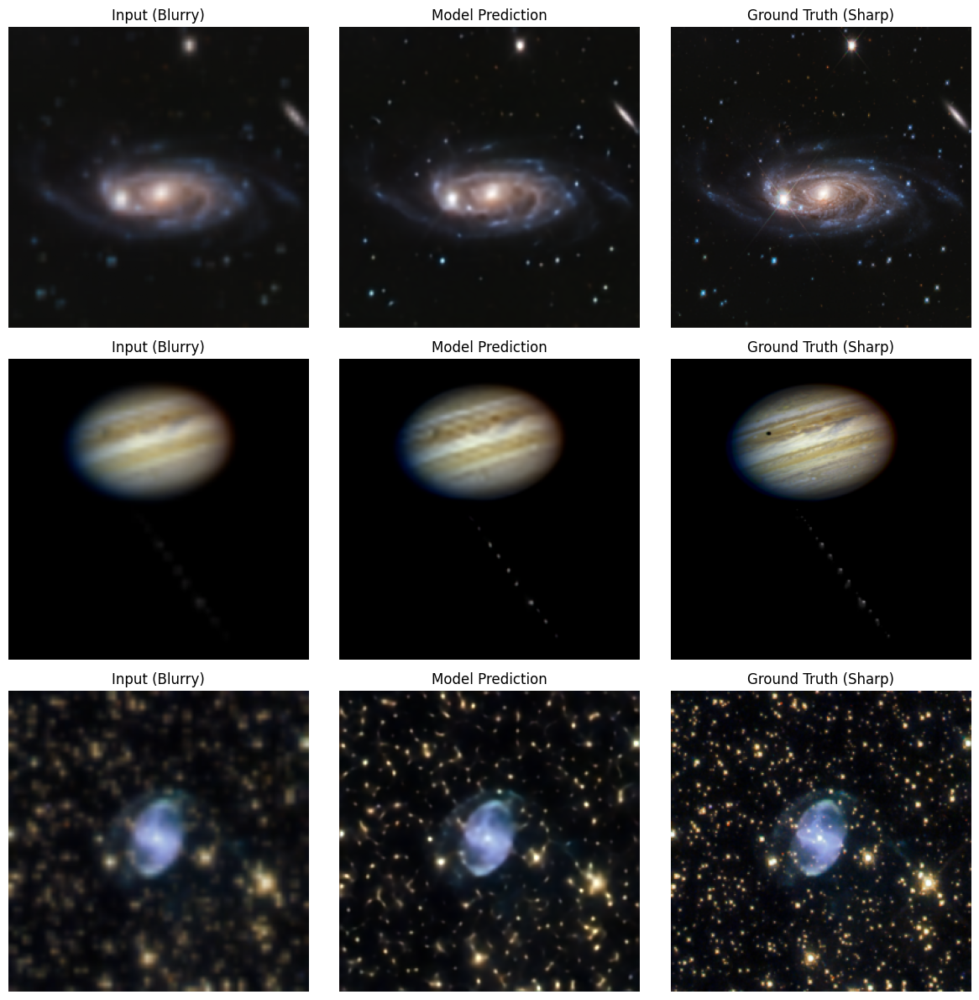

100%|██████████| 69/69 [01:32<00:00,  1.35s/it]


Epoch [41/50], Loss: 0.0117


100%|██████████| 69/69 [01:31<00:00,  1.33s/it]


Epoch [42/50], Loss: 0.0114


100%|██████████| 69/69 [01:31<00:00,  1.33s/it]


Epoch [43/50], Loss: 0.0114


100%|██████████| 69/69 [01:31<00:00,  1.33s/it]


Epoch [44/50], Loss: 0.0115


100%|██████████| 69/69 [01:32<00:00,  1.34s/it]


Epoch [45/50], Loss: 0.0115
Creating visualization...


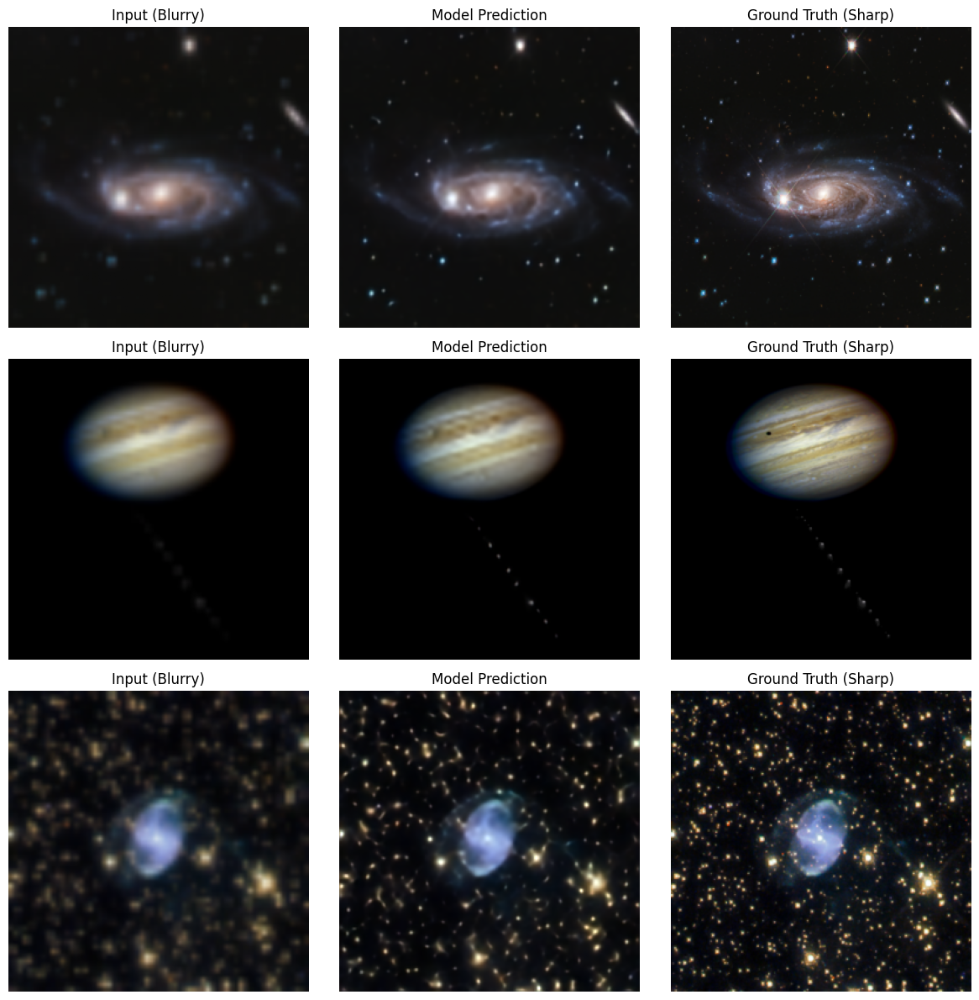

100%|██████████| 69/69 [01:32<00:00,  1.34s/it]


Epoch [46/50], Loss: 0.0115


100%|██████████| 69/69 [01:32<00:00,  1.33s/it]


Epoch [47/50], Loss: 0.0116


100%|██████████| 69/69 [01:32<00:00,  1.34s/it]


Epoch [48/50], Loss: 0.0114


100%|██████████| 69/69 [01:31<00:00,  1.33s/it]


Epoch [49/50], Loss: 0.0113


100%|██████████| 69/69 [01:32<00:00,  1.34s/it]


Epoch [50/50], Loss: 0.0116
Creating visualization...


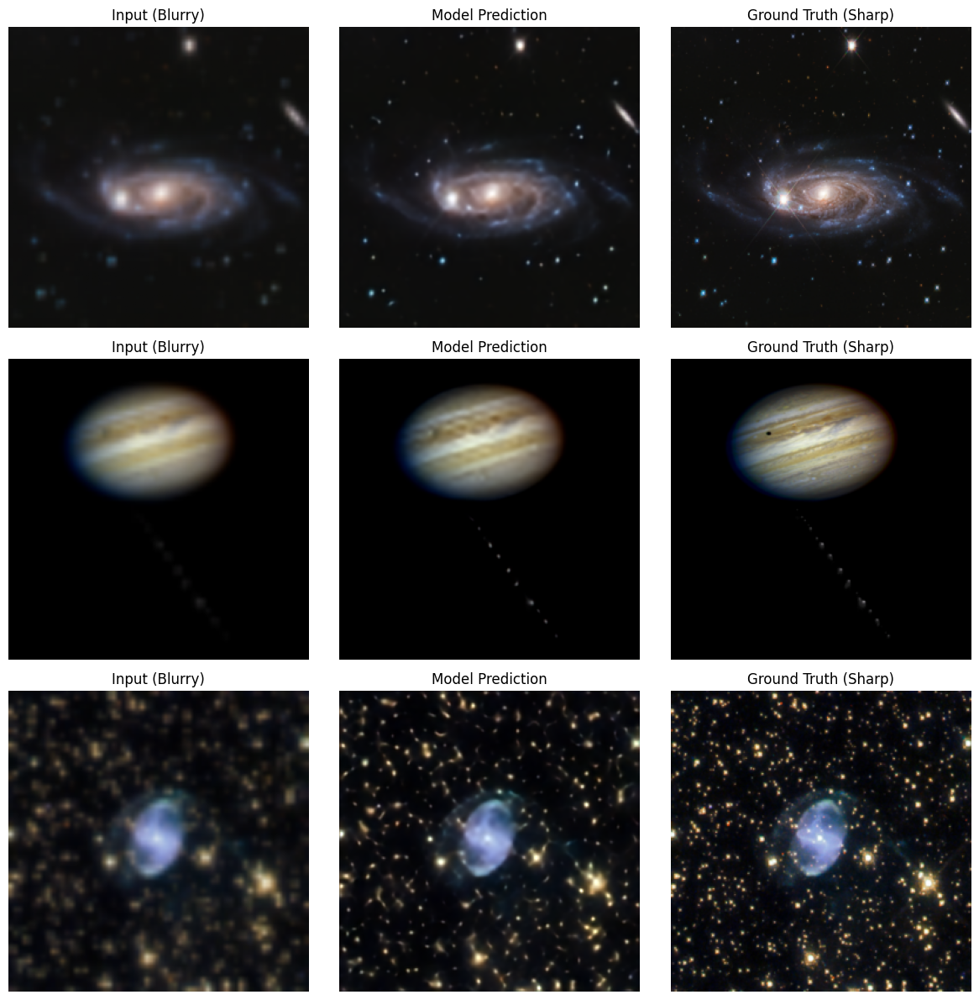

⏱️ Total Training Time: 77.77 minutes


In [ ]:
# Set number of epochs
num_epochs = 50

#TODO: What is this?????
Image.MAX_IMAGE_PIXELS = None

# Start Timer
start_time = time.time()


for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    train_losses = []
    for low_res, high_res in tqdm(train_loader):
        low_res, high_res = low_res.to(device), high_res.to(device)

        optimizer.zero_grad()
        outputs = model(low_res)
        loss = criterion(outputs, high_res)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        train_losses.append(running_loss / len(train_loader))
        
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}")
    
    # NEW: Visualize every 5 epochs
    if (epoch + 1) % 5 == 0:
        print("Creating visualization...")
        visualize_sample(model, test_loader, device)

# End Timer
end_time = time.time()
training_duration = end_time - start_time
print(f"⏱️ Total Training Time: {training_duration/60:.2f} minutes")

## Model evalutation

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.015177242..1.1010792].


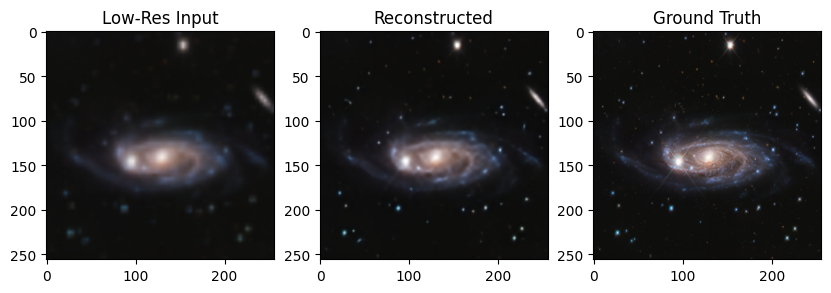

In [21]:
model.eval()
with torch.no_grad():
    sample_lr, sample_hr = next(iter(test_loader))
    sample_lr, sample_hr = sample_lr.to(device), sample_hr.to(device)
    pred = model(sample_lr)

# Convert tensor → image
plt.figure(figsize=(10,3))
plt.subplot(1,3,1)
plt.title("Low-Res Input")
plt.imshow(np.transpose(sample_lr[0].cpu().numpy(), (1,2,0)))
plt.subplot(1,3,2)
plt.title("Reconstructed")
plt.imshow(np.transpose(pred[0].cpu().numpy(), (1,2,0)))
plt.subplot(1,3,3)
plt.title("Ground Truth")
plt.imshow(np.transpose(sample_hr[0].cpu().numpy(), (1,2,0)))
plt.show()


In [23]:
def evaluate_metrics_with_baseline(model, loader, device):
    model.eval()
    
    # Trackers for Model Performance
    model_psnr, model_ssim = 0.0, 0.0
    
    # Trackers for Baseline (Input) Performance
    base_psnr, base_ssim = 0.0, 0.0
    
    num_images = 0
    
    print("📊 Calculating Baseline vs. Model metrics...")
    
    with torch.no_grad():
        for low_res, high_res in tqdm(loader):
            low_res = low_res.to(device)
            high_res = high_res.to(device)
            
            # 1. Generate Prediction
            outputs = model(low_res)
            
            # 2. Convert ALL images to Numpy (Input, Output, Target)
            # We clone low_res because we want to see how bad the input is
            inputs = low_res.cpu().clamp(0, 1).permute(0, 2, 3, 1).numpy()
            preds = outputs.cpu().clamp(0, 1).permute(0, 2, 3, 1).numpy()
            targets = high_res.cpu().clamp(0, 1).permute(0, 2, 3, 1).numpy()
            
            batch_size = preds.shape[0]
            for i in range(batch_size):
                inp = inputs[i] # The blurry input
                p = preds[i]    # The model output
                t = targets[i]  # The sharp target
                
                # --- BASELINE METRICS (Input vs Target) ---
                base_psnr += psnr_metric(t, inp, data_range=1.0)
                
                # Safe SSIM check for Baseline
                try:
                    val_b = ssim_metric(t, inp, data_range=1.0, channel_axis=2)
                except TypeError:
                    val_b = ssim_metric(t, inp, data_range=1.0, multichannel=True)
                base_ssim += val_b if not isinstance(val_b, tuple) else val_b[0]

                # --- MODEL METRICS (Output vs Target) ---
                model_psnr += psnr_metric(t, p, data_range=1.0)
                
                # Safe SSIM check for Model
                try:
                    val_m = ssim_metric(t, p, data_range=1.0, channel_axis=2)
                except TypeError:
                    val_m = ssim_metric(t, p, data_range=1.0, multichannel=True)
                model_ssim += val_m if not isinstance(val_m, tuple) else val_m[0]
                
                num_images += 1
                
    # Averages
    avg_base_psnr = base_psnr / num_images
    avg_base_ssim = base_ssim / num_images
    avg_model_psnr = model_psnr / num_images
    avg_model_ssim = model_ssim / num_images
    
    print("-" * 40)
    print(f"🌟 Final Evaluation over {num_images} images:")
    print(f"   📉 Baseline (Blurry):  PSNR: {avg_base_psnr:.2f} dB | SSIM: {avg_base_ssim:.4f}")
    print(f"   🚀 Model (Restored):   PSNR: {avg_model_psnr:.2f} dB | SSIM: {avg_model_ssim:.4f}")
    print("-" * 40)
    
    return avg_model_psnr, avg_model_ssim

evaluate_metrics_with_baseline(model, test_loader, device)

📊 Calculating Baseline vs. Model metrics...


100%|██████████| 18/18 [00:12<00:00,  1.46it/s]

----------------------------------------
🌟 Final Evaluation over 137 images:
   📉 Baseline (Blurry):  PSNR: 31.60 dB | SSIM: 0.8509
   🚀 Model (Restored):   PSNR: 34.42 dB | SSIM: 0.8955
----------------------------------------


(34.422846164414466, 0.8954774476315853)